# 2017.11.03

## Sample UW0387

## T = 4.2 K

Excitation with big excitation spot, ps-Mira (this time it was pulsing!)

Improved excitation spot

Scaling: $\ 92\,\mathrm{px} \approx 4\,\mathrm{\mu m} \quad \Rightarrow \quad 23\,\mathrm{px} \approx 1\,\mathrm{\mu m}$

**Temporary scale!** Must be checked again after measurements, since lens was moved slightly to set the focus for the laser spot.

FFT cross removal: https://blogs.mathworks.com/steve/2009/12/04/fourier-transform-visualization-using-windowing/

# Evaluate magnetic field scan

In [1]:
import numpy as np
import scipy as sci
import xarray as xr
from collections import OrderedDict
import holoviews as hv
hv.notebook_extension()
power_dim = hv.Dimension("Power", unit="µW")
intensity_dim = hv.Dimension("Intensity", unit="arb.u.")

import import_images as imp
import vortex_tools as vt
import vortex_tools_core as vtc

## Import data
consider slicing every 5th field instead of every 2nd

:HoloMap   [field]
   :Image   [x,y]   (intensity)
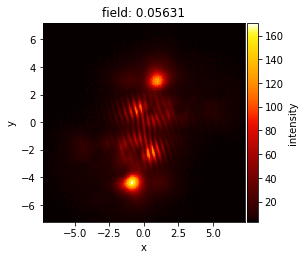
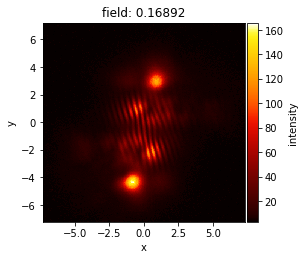
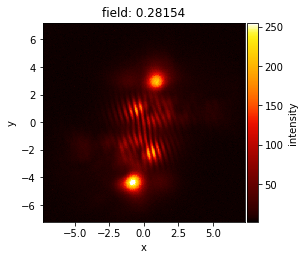
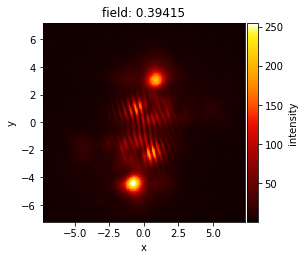
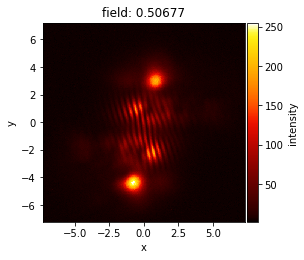
...
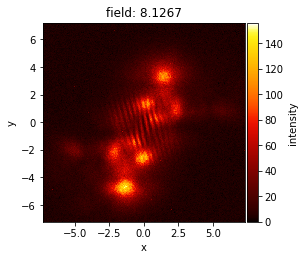
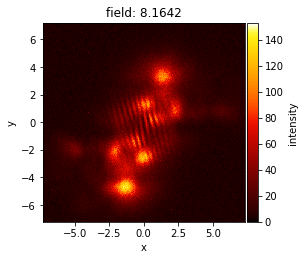
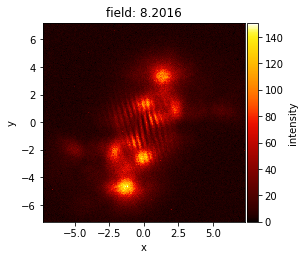
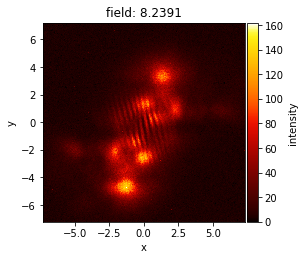
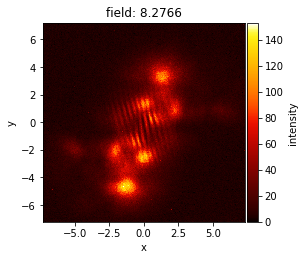

In [2]:
%%opts Image [colorbar=True, aspect="equal"] {+axiswise +framewise}
sequence = xr.open_dataarray("mag_sequence.nc")
hvsequence = hv.Dataset(sequence.sel(field=slice(None, None, 2))).to(hv.Image, kdims=["x", "y"])
hvsequence

:HoloMap   [field]
   :Image   [x,y]   (intensity)
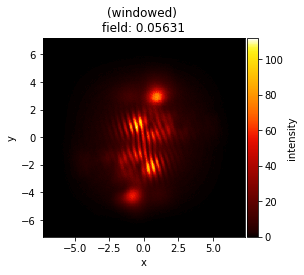
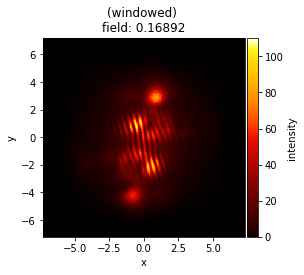
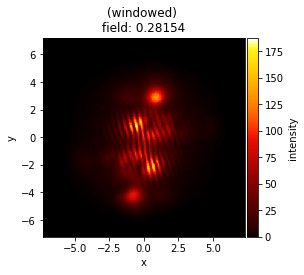
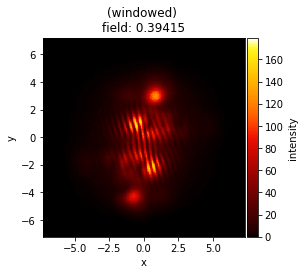
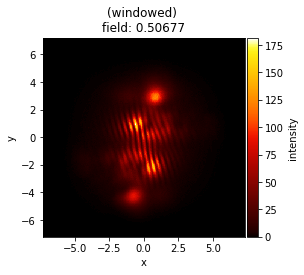
...
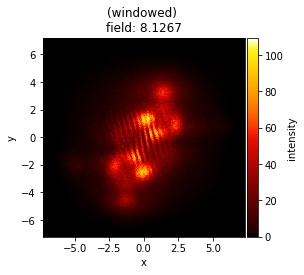
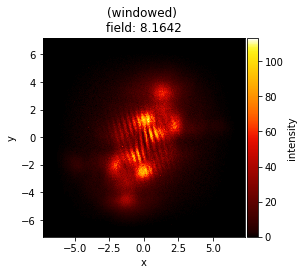
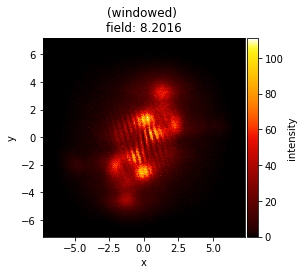
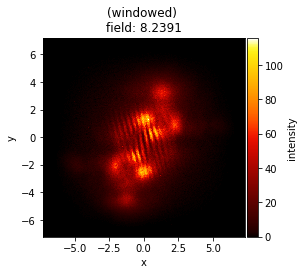
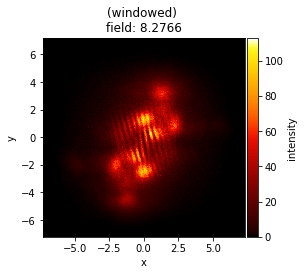

In [3]:
hvsequence_window = vt.apply_window(hvsequence, window="hann")
hvsequence_window

Extracting 0.05631
Extracting 0.39415
Extracting 0.73199
Extracting 1.0698299999999998
Extracting 1.40767
Extracting 1.74551
Extracting 2.08336
Extracting 2.4212
Extracting 2.7590399999999997
Extracting 3.09688
Extracting 3.43472
Extracting 3.77256
Extracting 4.1104
Extracting 4.44824
Extracting 4.78608
Extracting 5.12392
Extracting 5.46176
Extracting 5.7996
Extracting 6.13745
Extracting 6.47529
Extracting 6.79424
Extracting 7.01874
Extracting 7.24324
Extracting 7.46775
Extracting 7.69225
Extracting 7.90181
Extracting 8.01425
Extracting 8.12669
Extracting 8.23912


:NdLayout   [field]
   :Overlay
      .Image.I     :Image   [x,y]   (Fourier transform)
      .Ellipse.I   :Ellipse   [x,y]
      .Ellipse.II  :Ellipse   [x,y]
      .Ellipse.III :Ellipse   [x,y]
      .Ellipse.IV  :Ellipse   [x,y]
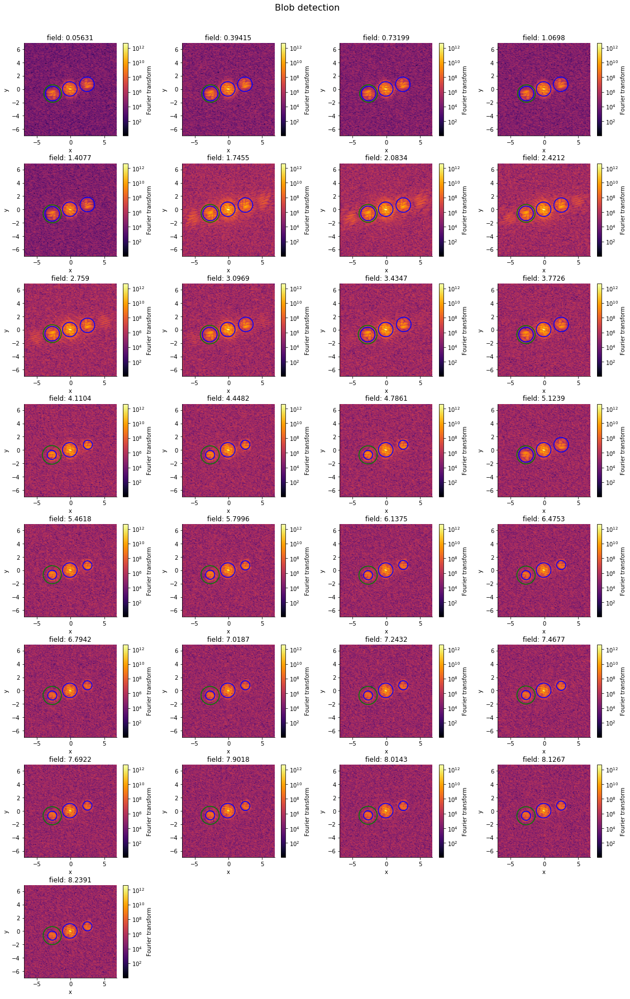

In [5]:
hvsequence_res = vt.extract_phase(hvsequence_window[::3], max_sigma=15, min_sigma=7)
hvsequence_res["report"].layout()

In [6]:
phase = vt.phase_shift_from_pixel(hvsequence_res["phase"][:, -4:4, -4:4])
phase = vt.phase_shift(phase, 0.5)
#phase.layout()

:HoloMap   [field]
   :RGB   [x,y]   (R,G,B)
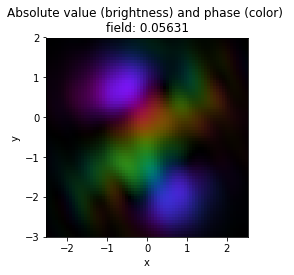
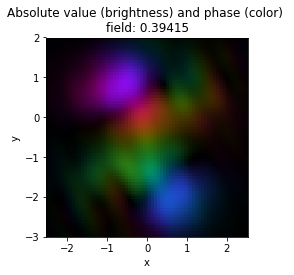
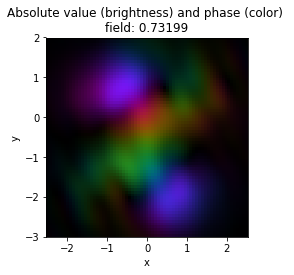
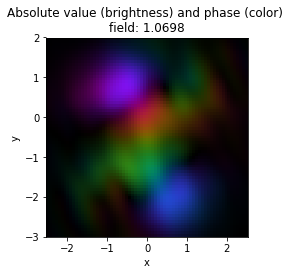
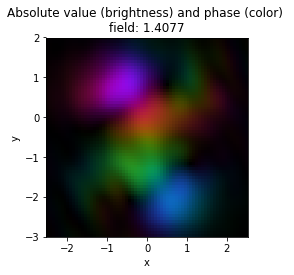
...
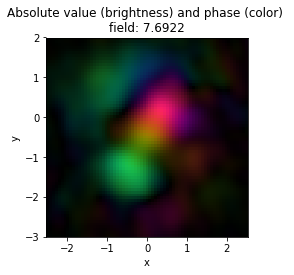
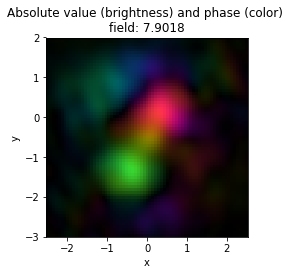
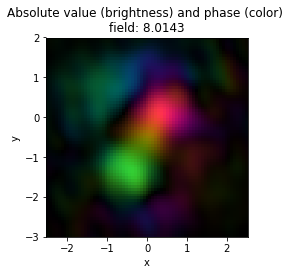
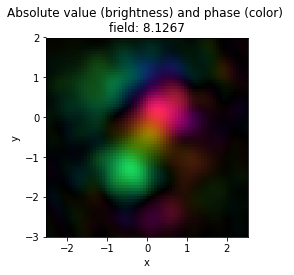
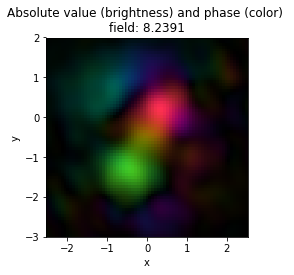

In [7]:
raw_inv_transform = hvsequence_res["raw_inv_transform"][:, -4:4, -4:4]
inv_transform = hv.HoloMap({key: vt.plot_rgb_phases(abs_map=raw_inv_transform[key],
                                                     phase_map=phase[key]) for key in phase.keys()}, 
                             kdims=["field"])
inv_transform[:, -2.5:2.5, -3:2]

### Export phase and absolute value as xarray

In [8]:
fields = phase.dimension_values("field")
xs = phase.dimension_values("x", expanded=False)
ys = phase.dimension_values("y", expanded=False)
phase_values = np.zeros((len(ys), len(xs), 0))
abs_values = np.zeros((len(ys), len(xs), 0))
for field in fields:
    phase_values = np.dstack((phase_values, phase[field].dimension_values("Intensity",
                                                                          flat=False)))
    abs_values = np.dstack((abs_values, raw_inv_transform[field].dimension_values("Intensity",
                                                                          flat=False)))

In [9]:
data_xr = xr.Dataset({"Absolute value": (["y", "x", "field"], abs_values),
                      "Phase": (["y", "x", "field"], phase_values)},
                     coords={"x": xs, "y": ys, "field": fields})
data_xr

<xarray.Dataset>
Dimensions:         (field: 29, x: 109, y: 111)
Coordinates:
  * x               (x) float64 -3.952 -3.879 -3.806 -3.733 -3.66 -3.586 ...
  * y               (y) float64 -3.977 -3.905 -3.833 -3.761 -3.688 -3.616 ...
  * field           (field) float64 0.05631 0.3942 0.732 1.07 1.408 1.746 ...
Data variables:
    Absolute value  (y, x, field) float64 0.2704 0.6259 0.5317 0.4746 0.3556 ...
    Phase           (y, x, field) float64 -0.6413 -0.5408 -0.6852 -0.661 ...

In [10]:
data_xr.to_netcdf("2017-11-03 mag sequence phase.nc",
                  encoding={"Absolute value": dict(zlib=True),
                            "Phase": dict(zlib=True)})

## Vortex finding code

In [7]:
from scipy import ndimage
from scipy.ndimage import filters
import skimage.feature as feature

def find_peaks(image, threshold=None, neighborhood_size=5, find_minima=False): 
    
    data = image.dimension_values(2, flat=False)[::-1]
    
    if threshold is None:
        threshold = data.max() / 2
    
    if find_minima == True:
        data_max = filters.maximum_filter(data, neighborhood_size)
        data_min = filters.minimum_filter(data, neighborhood_size)
        maxima = (data == data_min)
        diff = ((data_max - data_min) < threshold)
        maxima[diff == 0] = 0
    else:
        data_max = filters.maximum_filter(data, neighborhood_size)
        maxima = (data == data_max)
        data_min = filters.minimum_filter(data, neighborhood_size)
        diff = ((data_max - data_min) > threshold)
        maxima[diff == 0] = 0

    labeled, num_objects = ndimage.label(maxima)
    slices = ndimage.find_objects(labeled)
    x, y = [], []
    for dy,dx in slices:
        x_center = (dx.start + dx.stop - 1)/2
        x.append(x_center)
        y_center = (dy.start + dy.stop - 1)/2    
        y.append(y_center)
    
    res = [image.matrix2sheet(*xy) for xy in zip(y, x)]
    return res


def find_vortices(phase, inv_transform=None, method="laplace", threshold=None, neighborhood_size=7, sigma=1,
                  k=0.001, mask_threshold=0.02, mask_dilation=3, return_mask_and_res = False):

    phase_data = phase.dimension_values(2, flat=False)[::-1]
    
    if method == "laplace":
        # res = maximum(absolute_value(laplace(cosine(input))))
        phase_cos = np.cos(np.pi*phase_data)
        res = np.abs(ndimage.laplace(phase_cos))
    elif method == "harris_cos":
        # res = maximum(-harris_corner_filter(cos(input)))
        phase_cos = np.cos(np.pi*phase_data)
        res = feature.corner_harris(phase_cos, k=k, sigma=sigma)
        #res = np.abs(res)
        if threshold == None:
            threshold = 7
    else:
        raise Excpetion("Method must be 'laplace' or 'harris_cos'!")
    
    # prepare the mask
    if inv_transform == None:
        mask = np.ones_like(phase_data)
    else:
        mask_data = np.sum(np.dstack([inv_transform.dimension_values(i, flat=False)[::-1] for i in [2, 3, 4]]), axis=2)
        transf = mask_data / mask_data.max()
        mask = np.zeros_like(transf)
        mask[transf > mask_threshold] = 1
        mask = ndimage.binary_dilation(mask, iterations=mask_dilation)
        mask = ndimage.binary_fill_holes(mask)
    
    # apply the mask
    res[mask == 0] = 0
    
    peaks = find_peaks(phase.clone(data=res), threshold, neighborhood_size)
    
    if return_mask_and_res:
        return peaks, phase.clone(data=mask).relabel("Mask"), phase.clone(data=res).relabel("Processed input")
    else:
        return peaks


def plot_vortices(phase, peaks):
    if peaks is None:
        return phase
    style_options = dict(Scatter=dict(style=dict(color='none', edgecolor='red', s=150, alpha=0.8)))
    scatter = hv.Scatter(peaks).opts(style_options)
    overlay = (phase * scatter).relabel(phase.label + " ({} vortices)".format(len(peaks)))
    overlay = overlay.opts(dict(Overlay=dict(plot=dict(aspect="equal"))))
    return overlay

In [8]:
phase0 = phase[0.05631]
transform0 = inv_transform[0.05631]
imp.save_pickle(phase0, "phase0.p")
imp.save_pickle(transform0, "transform0.p")

Saved phase0.p (0.01 s)
Saved transform0.p (0.03 s)


## Go through all the sequence

field:  0.05631


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
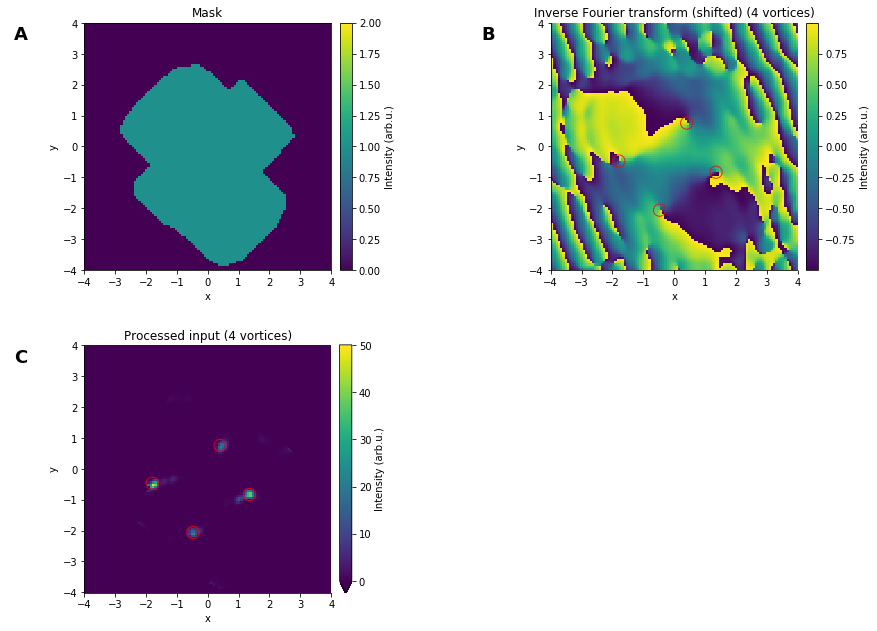

In [11]:
%%opts Image {+axiswise}
%%output size=150
vortex_map = hv.HoloMap(kdims=["field"])
mask_map = hv.HoloMap(kdims=["field"])
res_map = hv.HoloMap(kdims=["field"])
all_vortices = OrderedDict()

field = phase.keys()[0]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=9, neighborhood_size=7,
                                    mask_threshold=0.20, mask_dilation=12)
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

:Overlay
   .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Phase)
   .Scatter.I                                                                  :Scatter   [x]   (y)
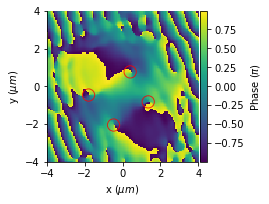

In [22]:
%%output size=75 fig="png" filename="tracked vortices 0T"
# get a nicer plot:
vmap0 = vortex_map[0.05631]
phase0 = vmap0.get(0)
vortices0 = vmap0.get(1)
vmap0 = phase0.clone(vdims=[hv.Dimension("Phase", unit="$\pi$")],
            kdims=[hv.Dimension("x", unit="$\mu m$"),
                   hv.Dimension("y", unit="$\mu m$")]) * vortices0
hv.Store
vmap0

field:  0.90091


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
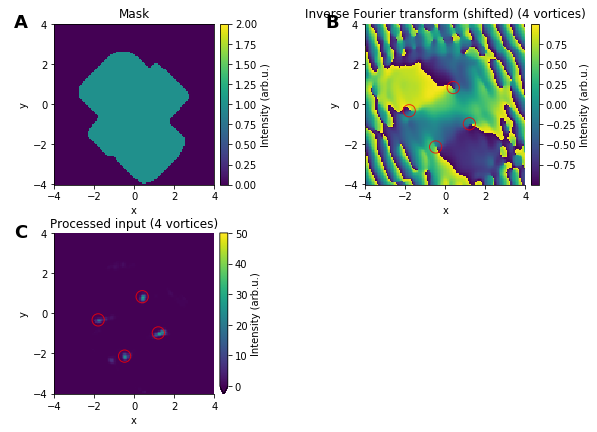

In [10]:
field = phase.keys()[1]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=9, neighborhood_size=7,
                                    mask_threshold=0.20, mask_dilation=12)
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  1.74551
(-0.32936421236617841, 1.1932488529604548)
(0.47574830675114699, 0.83165829145728676)
(-1.5736290146384091, -0.25311339305221736)
(1.1344767314835047, -1.1932488529604539)
(-0.47574830675114699, -2.1333843128686913)
(0.40255625955866359, -2.2057024251693251)
(0.47574830675114699, -2.7119292112737599)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
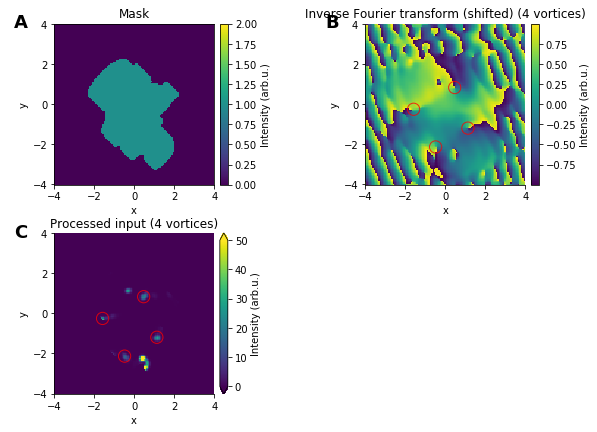

In [11]:
field = phase.keys()[2]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=9, neighborhood_size=7,
                                    mask_threshold=0.35, mask_dilation=7)
for v in vortices:
    print(v)
vortices = [vortices[i] for i in [1, 2, 3, 4]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  2.59012
(-0.4025562595586627, 2.5672929866724932)
(0.47574830675114699, 0.83165829145728676)
(-1.7200131090233777, -0.25311339305221736)
(1.1344767314835047, -1.1932488529604539)
(-0.4025562595586627, -2.2057024251693251)
(0.3293642123661793, -2.4226567620712256)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
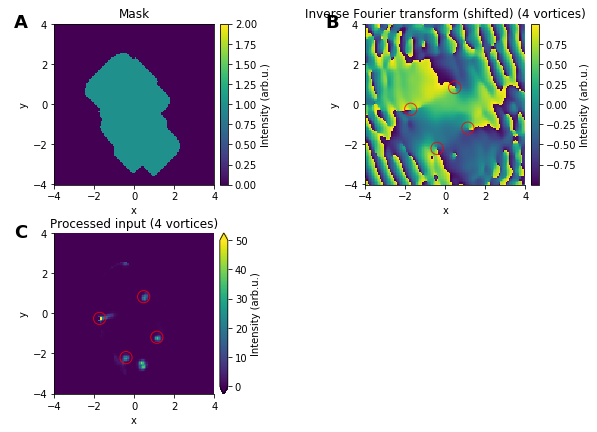

In [12]:
field = phase.keys()[3]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=9, neighborhood_size=7,
                                    mask_threshold=0.37, mask_dilation=12)
for v in vortices:
    print(v)
vortices = [vortices[i] for i in [1, 2, 3, 4]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  3.43472
(0.69532444832859985, 0.83165829145728676)
(-1.2076687786759885, -0.25311339305221736)
(0.91490058990605272, -1.120930740659821)
(-0.69532444832859941, -2.0610662005680576)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
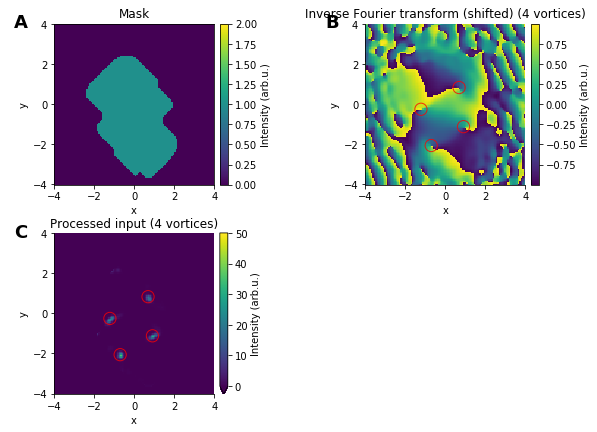

In [13]:
field = phase.keys()[4]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=9, neighborhood_size=7,
                                    mask_threshold=0.37, mask_dilation=12)
for v in vortices:
    print(v)
#vortices = [vortices[i] for i in [1, 2, 3, 4]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  4.27932
(0.91490058990605272, 0.75934017915665297)
(-0.84170854271356754, -0.10847716845094979)
(0.62213240113611556, -1.2655669652610877)
(-0.84170854271356754, -2.0610662005680576)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
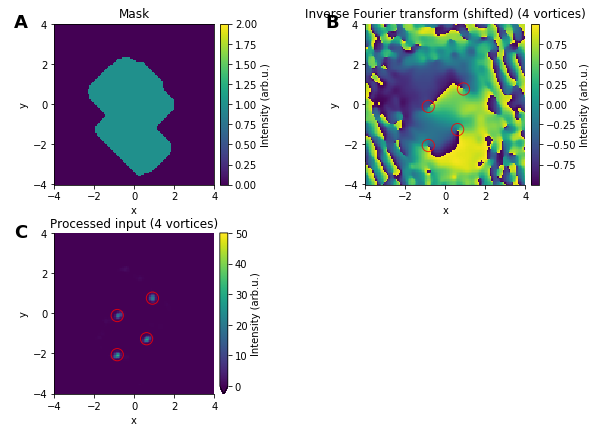

In [14]:
field = phase.keys()[5]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=9, neighborhood_size=7,
                                    mask_threshold=0.37, mask_dilation=12)
for v in vortices:
    print(v)
#vortices = [vortices[i] for i in [1, 2, 3, 4]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  5.12392
(0.91490058990605272, 0.68702206685601963)
(-0.84170854271356754, -0.036159056150316893)
(0.62213240113611556, -1.3378850775617215)
(-0.84170854271356754, -2.0610662005680576)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
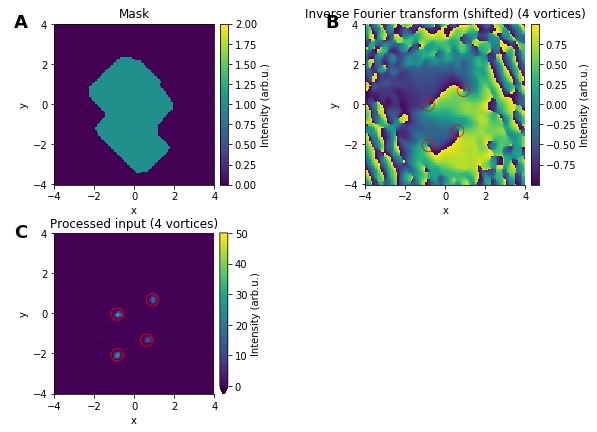

In [15]:
field = phase.keys()[6]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=9, neighborhood_size=7,
                                    mask_threshold=0.37, mask_dilation=12)
for v in vortices:
    print(v)
#vortices = [vortices[i] for i in [1, 2, 3, 4]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  5.96852
(1.0612846842910204, 0.75934017915665297)
(-0.76851649552108325, 0.036159056150316893)
(0.69532444832859985, -1.3378850775617215)
(-1.06128468429102, -1.9887480882674238)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
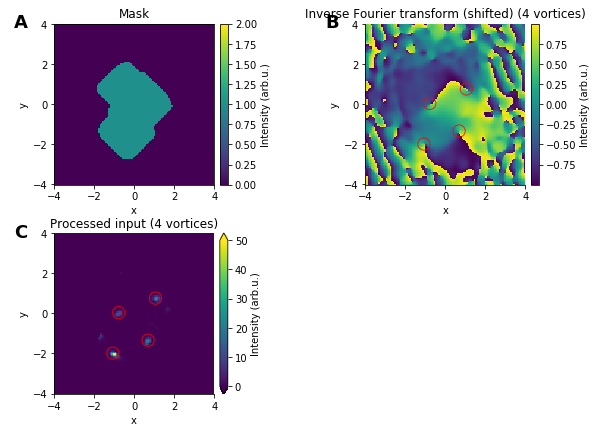

In [16]:
field = phase.keys()[7]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=11, neighborhood_size=7,
                                    mask_threshold=0.45, mask_dilation=12)
for v in vortices:
    print(v)
#vortices = [vortices[i] for i in [1, 2, 3, 4]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  7.3555
(1.1344767314835047, 0.75934017915665297)
(1.6468210618308938, 0.5423858422547525)
(-0.62213240113611512, 0.18079528075158446)
(0.54894035394363128, -1.4102031898623553)
(-1.06128468429102, -2.0610662005680576)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
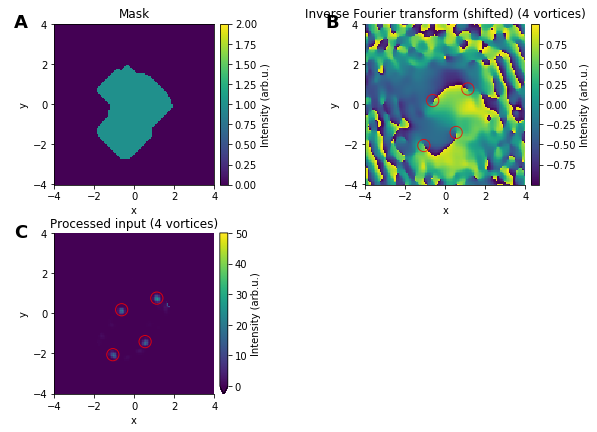

In [17]:
field = phase.keys()[9]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=16, neighborhood_size=7,
                                    mask_threshold=0.45, mask_dilation=12)
for v in vortices:
    print(v)
vortices = [vortices[i] for i in [0, 2, 3, 4]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  7.90181
(1.1344767314835047, 0.68702206685601963)
(-0.76851649552108325, 0.036159056150316893)
(0.47574830675114699, -1.6271575267642557)
(-1.06128468429102, -2.0610662005680576)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
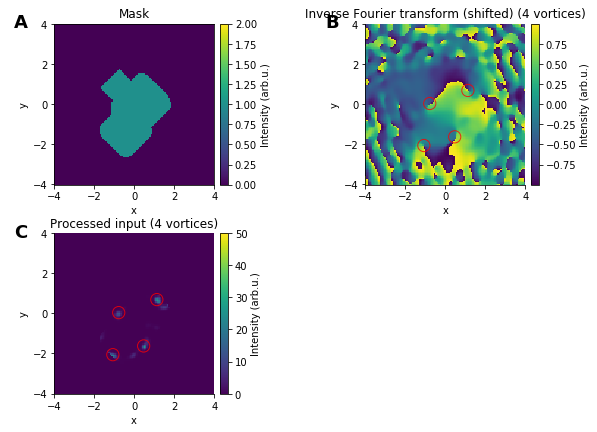

In [18]:
field = phase.keys()[10]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=10, neighborhood_size=7,
                                    mask_threshold=0.5, mask_dilation=12)
for v in vortices:
    print(v)
#vortices = [vortices[i] for i in [0, 2, 3, 4]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

field:  8.18291
(1.207668778675989, 0.75934017915665297)
(1.5736290146384095, 0.32543150535285159)
(-0.62213240113611512, 0.18079528075158446)
(0.40255625955866359, -1.7717937513655233)
(0.10978807078872643, -1.9887480882674238)
(-1.06128468429102, -2.0610662005680576)


:Layout
   .Image.Mask                                                                                                                 :Image   [x,y]   (Intensity)
   .Overlay.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis_left_parenthesis_4_vortices_right_parenthesis :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .Scatter.I                                                                  :Scatter   [x]   (y)
   .Overlay.Processed_input_left_parenthesis_4_vortices_right_parenthesis                                                      :Overlay
      .Image.Processed_input :Image   [x,y]   (Intensity)
      .Scatter.I             :Scatter   [x]   (y)
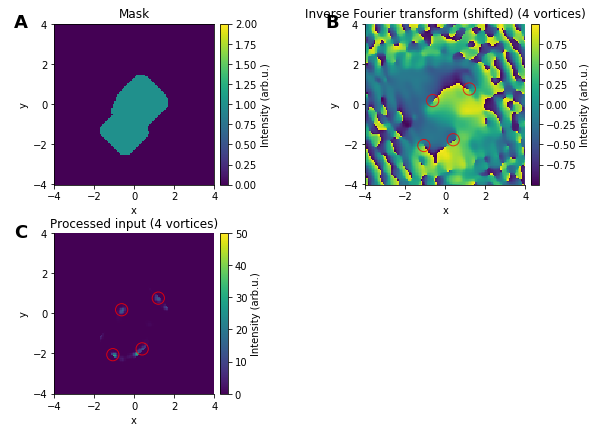

In [19]:
field = phase.keys()[11]
print("field: ", field)
vortices, mask, res = find_vortices(phase[field], inv_transform[field], method="harris_cos",
                                    return_mask_and_res=True, threshold=7, neighborhood_size=5,
                                    mask_threshold=0.6, mask_dilation=12)
for v in vortices:
    print(v)
vortices = [vortices[i] for i in [0, 2, 3, 5]]
all_vortices[field] = vortices
vortex_map[field] = plot_vortices(phase[field], vortices)
mask_map[field] = mask
res_map[field] = plot_vortices(res.opts("Image (clims=(0, 50))"), vortices)
(mask_map[field] + vortex_map[field] + res_map[field]).cols(2)

In [20]:
def nearest_vortex(vortex, vortices):
    distances = [np.sqrt((vortex[0] - v[0])**2 + (vortex[1] - v[1])**2)  for v in vortices]
    index = distances.index(min(distances))
    return vortices[index]

ordered_vortices = OrderedDict()
first_key = list(all_vortices.keys())[0]
number_of_vortices = len(all_vortices[first_key])
for vort_index in range(number_of_vortices):
    ordered_vortices[vort_index] = OrderedDict()
for vort_index in range(number_of_vortices):
    prev_field = 0
    for field in all_vortices.keys():
        if bool(ordered_vortices[vort_index]) == False:
            ordered_vortices[vort_index][field] = all_vortices[field][vort_index]
        else:
            nearest = nearest_vortex(ordered_vortices[vort_index][prev_field], all_vortices[field])
            ordered_vortices[vort_index][field] = nearest
        prev_field = field

:HoloMap   [field]
   :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .NdOverlay.I                                                                :NdOverlay   [Vortex]
         :Curve   [x]   (y)
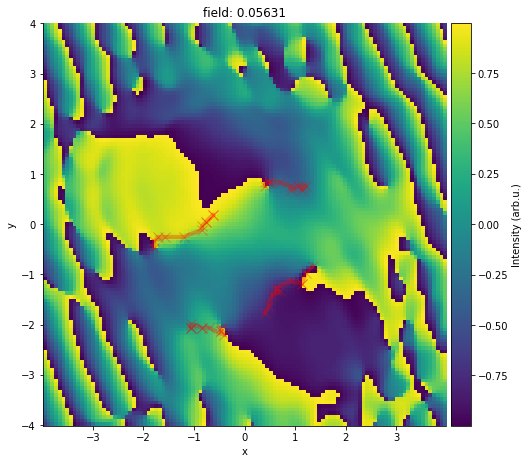
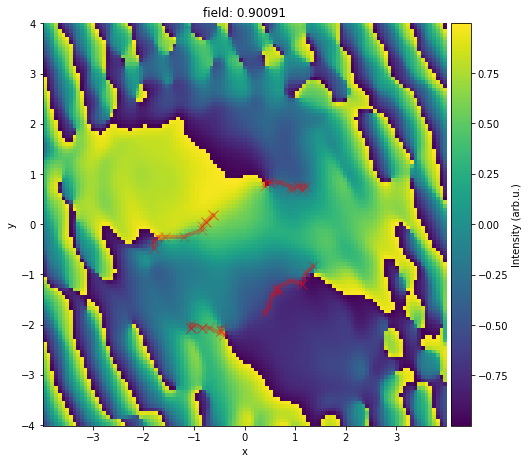
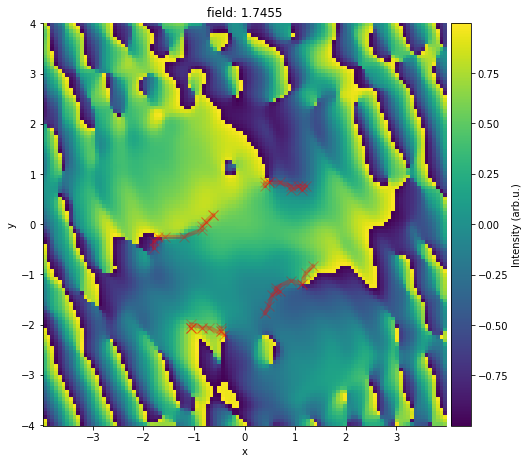
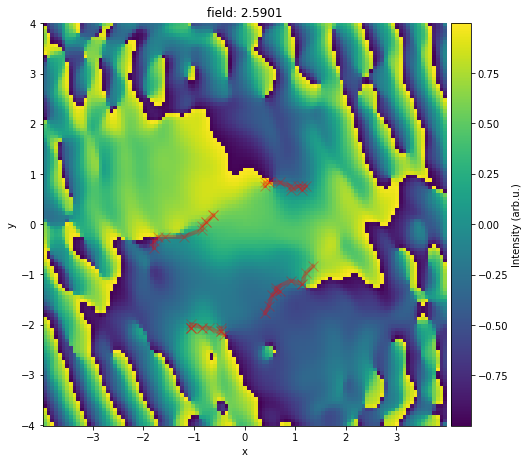
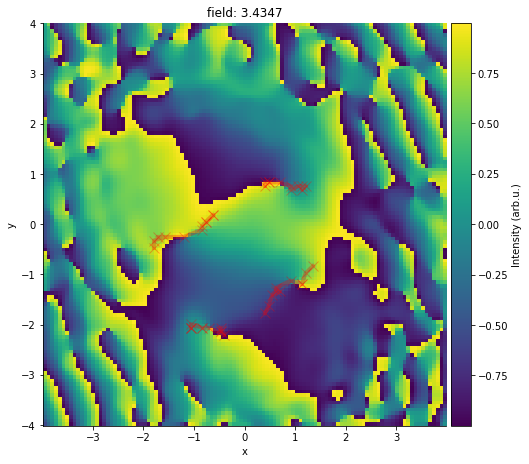
...
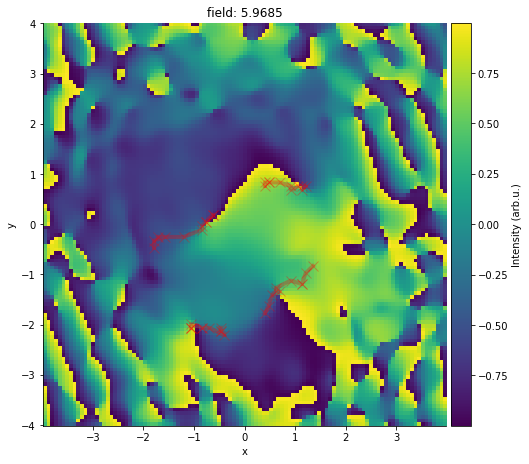
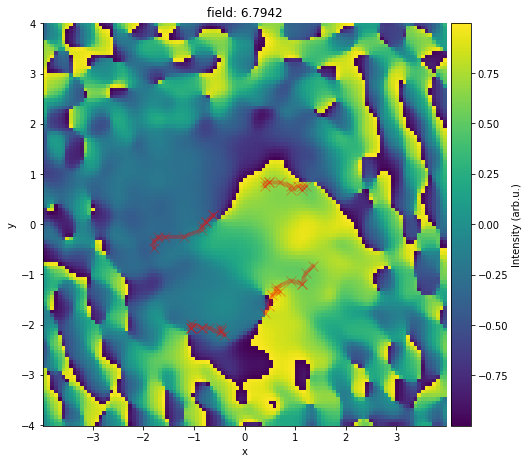
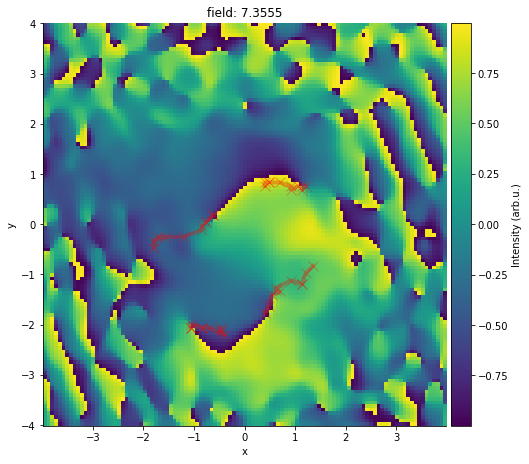
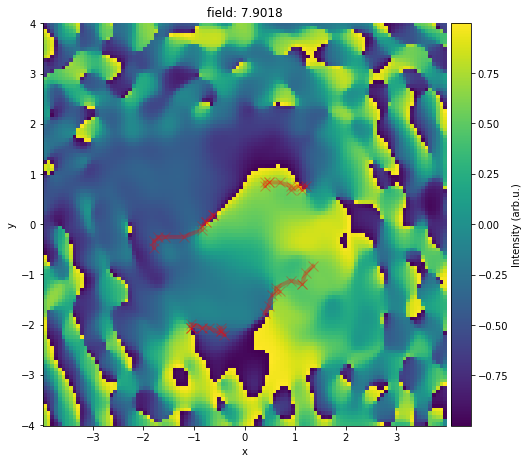
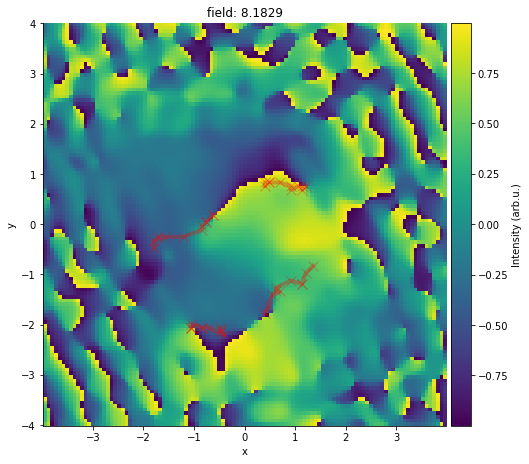

In [23]:
%%opts Curve (marker="x", alpha=0.3, color="red", linewidth=4, ms=10) Overlay [show_legend=False]
%%output size=200
vortex_trajectories = hv.HoloMap(kdims=["Vortex"])
for vort_index in ordered_vortices.keys():
    vortex_trajectories[vort_index] = hv.Curve(ordered_vortices[vort_index].values())
phase * vortex_trajectories.overlay()

In [28]:
%%output size=200
imp.make_video_from_hmap((phase * vortex_trajectories.overlay()).opts("Overlay [show_legend=False]"), "tracked_vortices.mp4")

writing key 0.05631


writing key 0.90091
writing key 1.74551
writing key 2.5901199999999998
writing key 3.43472
writing key 4.27932
writing key 5.12392
writing key 5.96852
writing key 6.79424
writing key 7.3555
writing key 7.90181
writing key 8.18291


:HoloMap   [field]
   :Overlay
      .Image.Inverse_Fourier_transform_left_parenthesis_shifted_right_parenthesis :Image   [x,y]   (Intensity)
      .NdOverlay.I                                                                :NdOverlay   [Vortex]
         :Scatter   [x]   (y)
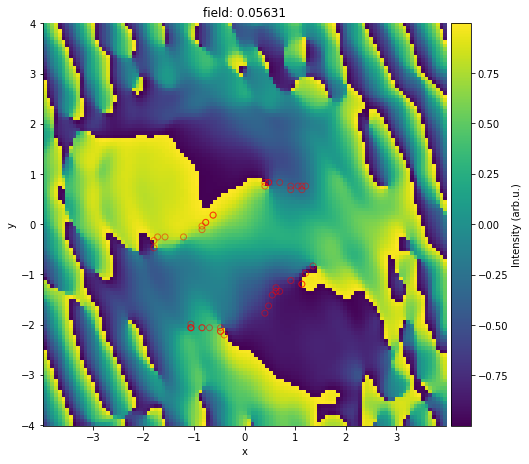
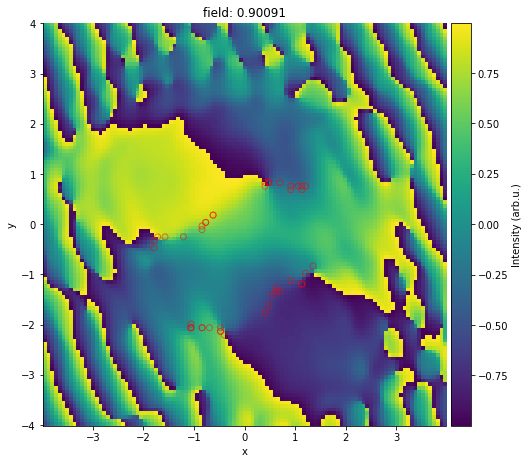
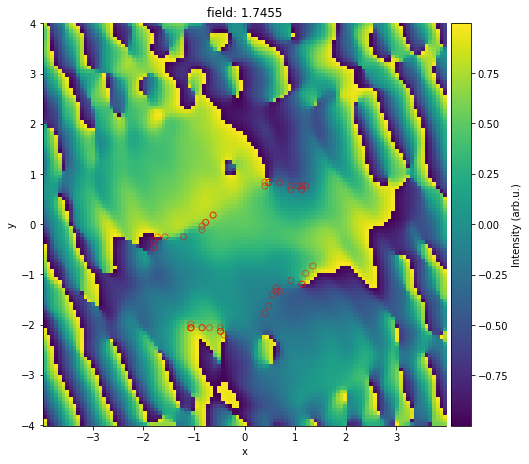
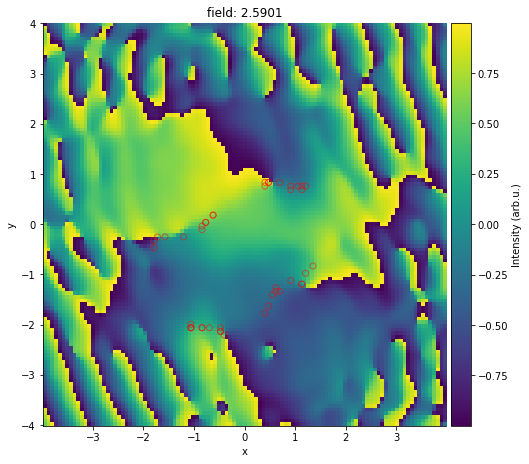
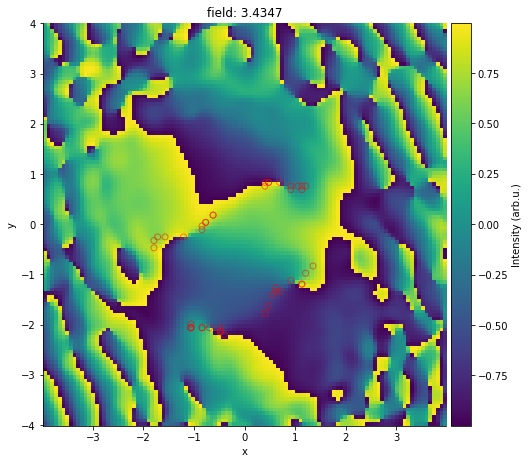
...
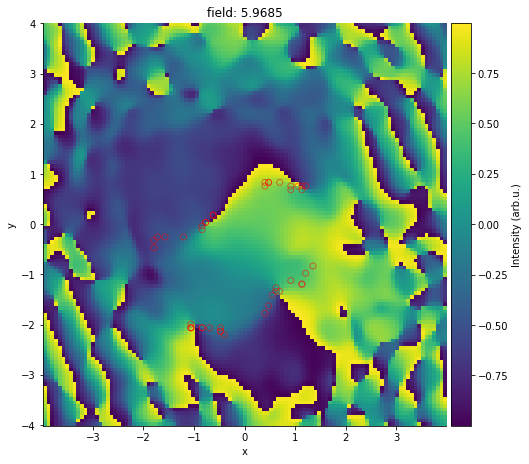
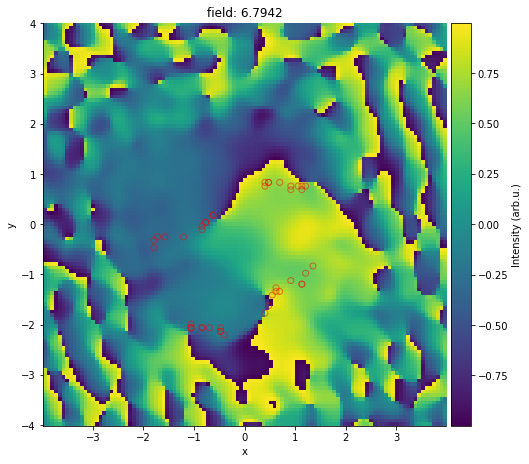
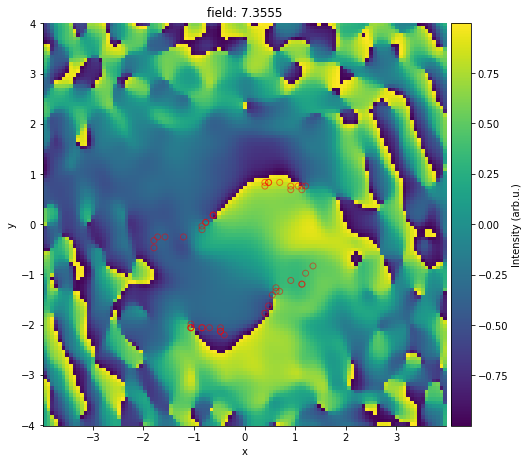
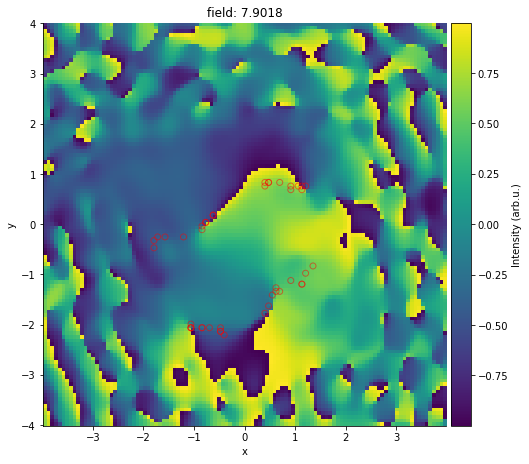
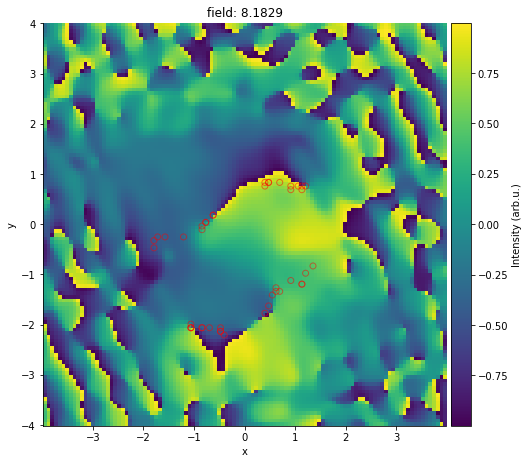

In [22]:
%%opts Scatter (marker="o", alpha=0.5, color="none", edgecolor="red") Overlay [show_legend=False]
%%output size=200
vortex_trajectories = hv.HoloMap(kdims=["Vortex"])
for vort_index in ordered_vortices.keys():
    vortex_trajectories[vort_index] = hv.Scatter(ordered_vortices[vort_index].values())
phase * vortex_trajectories.overlay()